# Project

# Imports

In [1]:
import numpy as np
import scipy
import math
import random
import pandas as pd
from matplotlib import animation
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt
import os
import time
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format='retina'

rc_params = {'backend': 'ps',
            'font.family': 'Times New Roman',
            'font.sans-serif': ['Bitstream Vera Sans'],
            'axes.unicode_minus':False,
            'text.usetex':True,
            'axes.grid':True,
            'grid.linestyle':'-',
            'grid.linewidth':0.5,
            'hist.bins':50,
            'axes.labelsize':14,
            'axes.titlesize':14,
            'xtick.labelsize':10,
            'ytick.labelsize':10,
            'legend.fontsize':10,
            'savefig.bbox':'tight',
            'savefig.transparent':False,
            'figure.dpi':100}
plt.rcParams.update(rc_params)

In [2]:
def dati (data,N):

    step = N*3+3
    
    t = np.array([data.iloc[2::step,0].copy().dropna()]).flatten()
    m = np.array([data.iloc[i::step,0].copy().dropna() for i in range(3, N+3)])
    x = np.array([data.iloc[i::step,0].copy().dropna() for i in range(N+3, 2*N+3)])
    y = np.array([data.iloc[i::step,1].copy().dropna() for i in range(N+3, 2*N+3)])
    z = np.array([data.iloc[i::step,2].copy().dropna() for i in range(N+3, 2*N+3)])
    vx = np.array([data.iloc[i::step,0].copy().dropna() for i in range(2*N+3, 3*N+3)])
    vy = np.array([data.iloc[i::step,1].copy().dropna() for i in range(2*N+3, 3*N+3)])
    vz = np.array([data.iloc[i::step,2].copy().dropna() for i in range(2*N+3, 3*N+3)])

    r = np.array([(x[i]**2+y[i]**2+z[i]**2)**0.5 for i in range(N)])
        
    return x,y,z,r,t

def find_nearest(array, value):
    array = np.asarray(array)
    idx   = (np.abs(array-value)).argmin()
    return idx

# Parameters of the system

In [3]:
N = 10**5
a = 10
G = 1
M_tot = 10
beta = 0.15
M = np.ones(N)*M_tot/N

$$ \text{Plummer-Kuzmin distribution} $$

$$\text{Potential:} \quad \Phi (R,z=0) = - \frac{GM}{\sqrt{R^2 +a^2}} \qquad \text{Density distribution:} \quad \Sigma(R)=\frac{M}{2\pi}\frac{a}{(R^2+a^2)^{3/2}} $$

$$M(R)=2\pi\int_0^RdR'R'\Sigma(R') = M\int_0^RdR'R'\frac{a}{(R'^2+a^2)^{3/2}}=\frac{1}{2}\int_0^{\frac{R^2}{a^2}}M\frac{1}{(1+y)^{3/2}}=\frac{M}{(1+y)^{1/2}}\Big|_0^{\frac{R^2}{a^2}}=M\left[1-\frac{1}{(\frac{R^2}{a^2}+1)^{1/2}}\right]$$
$$\text{Radial coordinate:} \quad R = \left[\frac{1}{(1-\frac{M(R)}{M})^2}-1\right]^{1/2}\cdot a \quad \text{with} \quad 0<\frac{M(R)}{M}<1 \qquad ; \qquad \text{Angular coordinate:} \quad 0< \theta < 2\pi$$

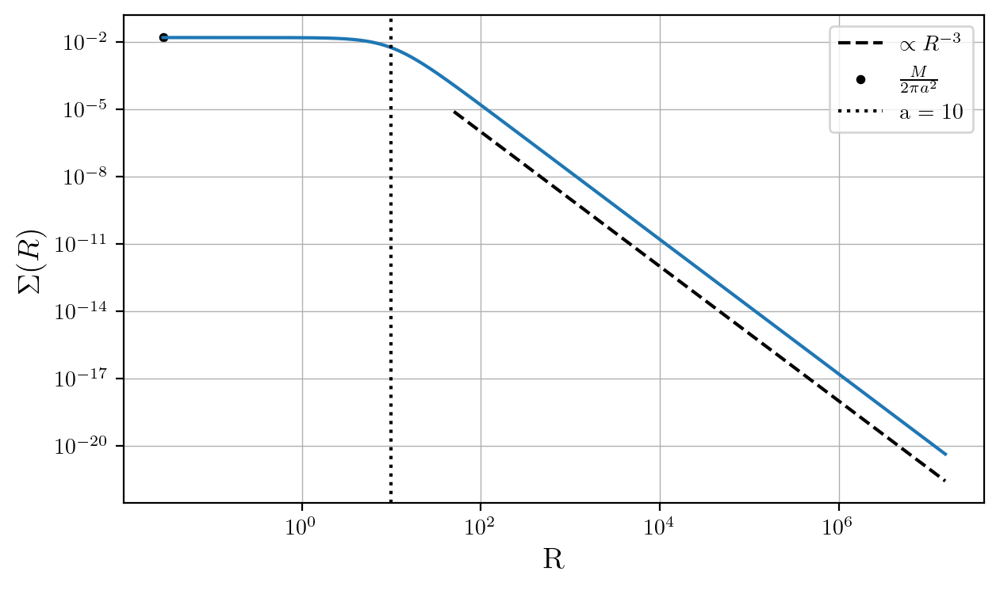

In [4]:
random.seed(0)

cdf   = np.random.uniform(0,1,N) #cdf = M(R)/M_tot

R     = ((1/(1-cdf)**2 -1)**(1/2))*a
theta = np.random.uniform(0,2*np.pi,N)

#Sort in the same order
sort  = np.argsort(R)
R     = R[sort]
idx_a = find_nearest(R,a)
theta = theta[sort]
Rgrid_ext = np.geomspace(5*a,R[-1],1000)
Rgrid_int = np.geomspace(R[0],a/2,1000)
Sigma = M_tot/(2*np.pi) * a /((R**2+a**2)**(3/2))

fig,ax = plt.subplots(figsize=(7,4))
ax.plot(R,Sigma)
ax.plot(Rgrid_ext,Rgrid_ext**(-3), ls='--', label='$\propto R^{-3}$', c='k')
ax.scatter(R[0],M_tot/(2*np.pi*a**2), c='k', s=10, label=r'$\frac{M}{2\pi a^2}$')
ax.axvline(a, ls=':', c='k', label='a = %i'%a)
ax.set_ylabel('$\Sigma(R)$')
ax.set_xlabel('R')
ax.legend()
plt.loglog()
plt.show()

$$ \text{Circular orbits:} \quad R\dot{\theta}^2 =  \nabla \Phi \qquad \text{Circular velocity:} \quad \dot{\theta}^2 = \frac{GM}{(R^2 +a^2)^{\frac{3}{2}}}$$

$$ \text{Toomre parameter:} \quad Q=\frac{\sigma_R k}{3.36 G \Sigma}$$

$$k^2=\frac{\partial\Phi_{eff}}{\partial R^2}\Big|_{0} = R \frac{\partial \dot{\theta}^2}{\partial R} + 4 \dot{\theta}^2 = - \frac{3GMR^2}{(R^2 +a^2)^{\frac{5}{2}}} + 4\dot{\theta}^2 = GM \left( - \frac{3R^2}{(R^2 +a^2)^{\frac{5}{2}}} + \frac{4}{(R^2 +a^2)^{\frac{3}{2}}} \right)$$

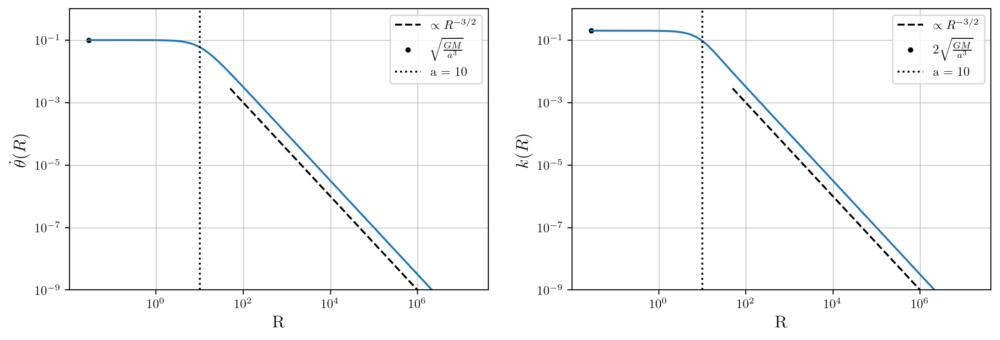

In [5]:
theta_punto = (G*M_tot*(1/(R**2 + a**2)**(3/2)))**(1/2)
k = (G*M_tot*(-(3*R**2)/(R**2 + a**2)**(5/2) + 4/(R**2 + a**2)**(3/2)))**(1/2)

fig,(ax1,ax2) = plt.subplots(1,2, figsize=(13,4))

ax1.plot(R,theta_punto)
ax1.plot(Rgrid_ext,Rgrid_ext**(-3/2), ls='--', label='$\propto R^{-3/2}$', c='k')
ax1.scatter(R[0],(G*M_tot/(a**3))**(1/2), c='k', s=10, label=r'$\sqrt{\frac{GM}{a^3}}$')
ax1.axvline(a, ls=':', c='k', label='a = %i'%a)
ax1.set_ylabel(r'$\dot{\theta} (R)$')
ax1.set_xlabel('R')
ax1.legend()
ax1.set_ylim(1e-9,1)
ax1.loglog()

ax2.plot(R,k)
ax2.plot(Rgrid_ext,Rgrid_ext**(-3/2), ls='--', label='$\propto R^{-3/2}$', c='k')
ax2.scatter(R[0],2*(G*M_tot/(a**3))**(1/2), c='k', s=10, label=r'$2\sqrt{\frac{GM}{a^3}}$')
ax2.axvline(a, ls=':', c='k', label='a = %i'%a)
ax2.set_ylabel(r'$k(R)$')
ax2.set_xlabel('R')
ax2.set_ylim(1e-9,1)
ax2.legend()
ax2.loglog()
plt.show()

$$ \frac{Q}{\sigma_R} = \frac{k}{3.36 G \Sigma}$$

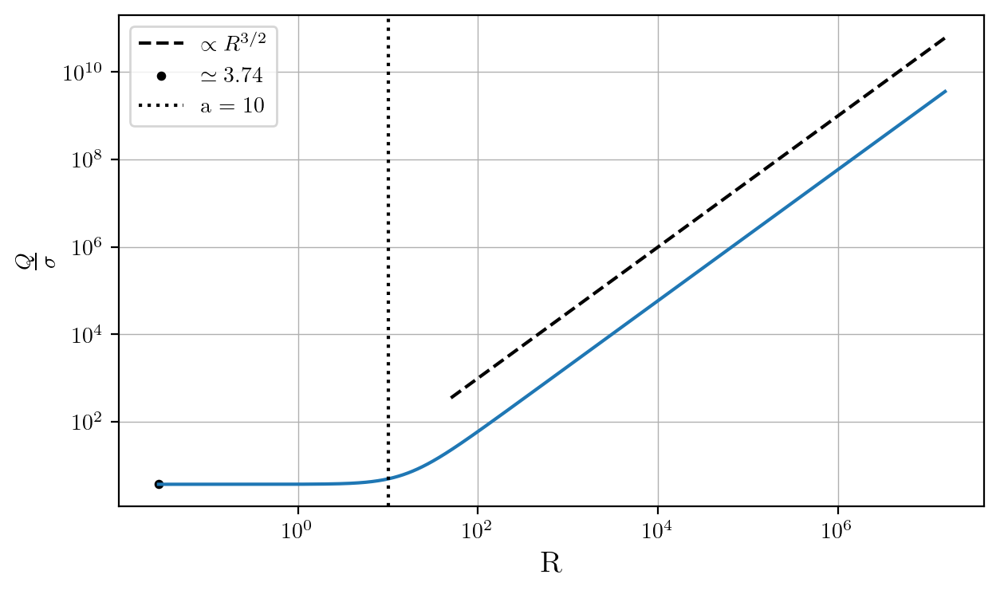

In [6]:
fig, ax = plt.subplots(1,1, figsize=(7,4))

ax.plot(R, k/(3.36*G*Sigma))
ax.plot(Rgrid_ext,Rgrid_ext**(3/2), ls='--', label='$\propto R^{3/2}$', c='k')
ax.scatter(R[0],k[0]/(3.36*G*Sigma[0]), c='k', s=10, label=r'$\simeq %.2f$'%(k[0]/(3.36*G*Sigma[0])))
ax.axvline(a, ls=':', c='k', label= 'a = %i'%a)
ax.set_ylabel(r'$\frac{Q}{\sigma}$')
ax.set_xlabel('R')
ax.legend()
ax.loglog()
plt.show()

<span style="font-family: Times New Roman"> I choose the radial velocity dispersion to be a fraction ($\beta$ = 0.15) of the circular velocity. In this way the Toomre parameter Q increases with R. It reaches 1 at R=31. </span>
$$ Q = \frac{\sigma_R k}{3.36 G \Sigma} \qquad \text{with :} \qquad \sigma_R = \beta R \dot{\theta} $$

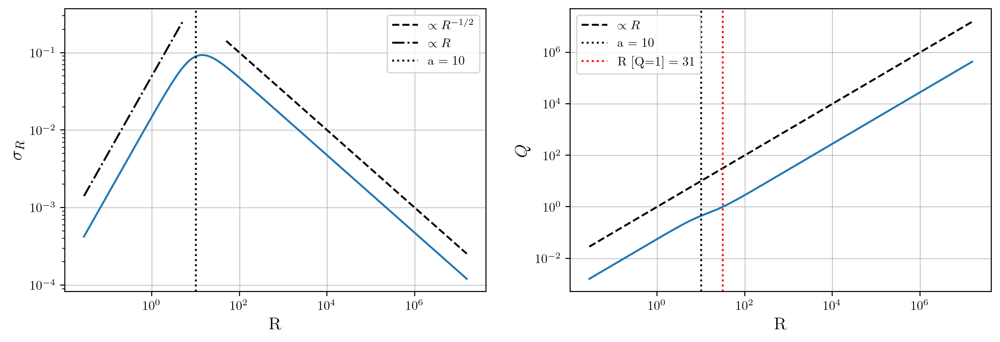

In [7]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(13,4))

sigma = R*theta_punto*beta

ax1.plot(R, sigma)
ax1.plot(Rgrid_ext,Rgrid_ext**(-1/2), ls='--', label=r'$\propto R^{-1/2}$', c='k')
ax1.plot(Rgrid_int,Rgrid_int/20, ls='-.', label=r'$\propto R$', c='k')
ax1.axvline(a, ls=':', c='k', label='a = %i'%a)
ax1.set_ylabel(r'$\sigma_R$')
ax1.set_xlabel('R')
ax1.legend()
ax1.loglog()

Q=sigma*k/(3.36*G*Sigma)
idx_Q = find_nearest(Q,1)
R_Q = R[idx_Q]
ax2.plot(R, Q)
ax2.plot(R,R, ls='--', label=r'$\propto R$', c='k')
ax2.axvline(a, ls=':', c='k', label='a = %i'%a)
ax2.axvline(R_Q, ls=':', c='r', label='R [Q=1] = %i'%R_Q)
ax2.set_ylabel(r'$Q$')
ax2.set_xlabel('R')
ax2.legend()
ax2.loglog()

plt.show()


## Initial positions and velocities

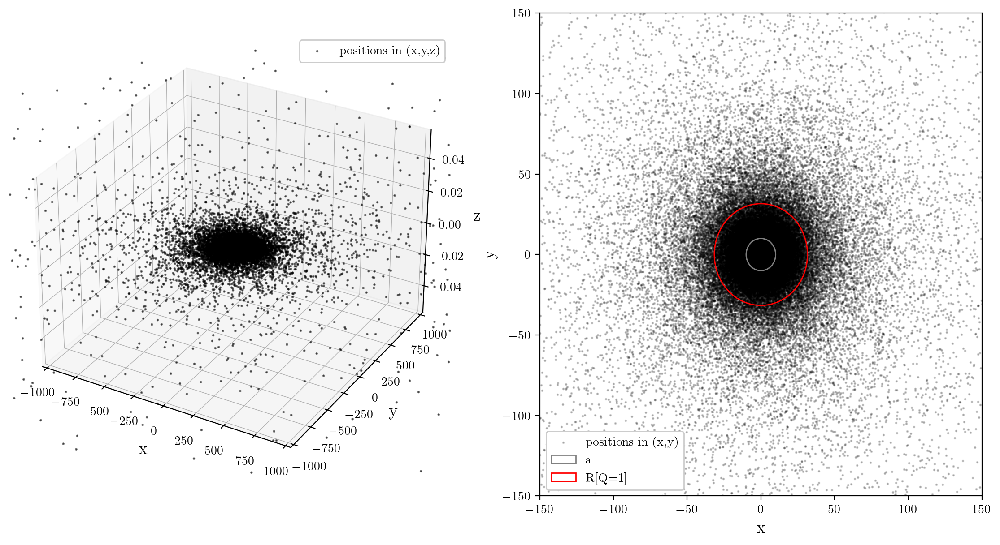

In [8]:
X = R*np.cos(theta)
Y = R*np.sin(theta)
Z = np.zeros(N)

fig = plt.figure(figsize=(14,7))
ax = fig.add_subplot(121, projection = '3d')

ax.scatter3D(X,Y,Z, color='k', s=1, alpha=0.5, label='positions in (x,y,z)');
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_xlim(-1e3,1e3)
ax.set_ylim(-1e3,1e3)
plt.legend(loc='upper right', framealpha=1)

ax = fig.add_subplot(122)
ax.scatter(X,Y, color='k', s=1, alpha=0.2, label='positions in (x,y)');
circle = plt.Circle((0, 0, 0), a, color='gray', fill=False, label='a')
circle_Q = plt.Circle((0, 0, 0), R_Q, color='r', fill=False, label='R[Q=1]')
ax.add_patch(circle)
ax.add_patch(circle_Q)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_xlim(-150,150)
ax.set_ylim(-150,150)
ax.grid()
plt.legend(framealpha=1)
plt.show()



<span style="font-family: Times New Roman"> The azimuthal component of the velocity is equal to the circular velocity while the radial component of the velocity is taken from a normal distribution centered in 0 with width equal to the radial velocity dispersion. </span>
$$\dot{x}=\dot{R}cos\theta - R sin\theta\dot{\theta} = N(0,\sigma_R)cos\theta - R sin\theta\dot{\theta}$$ 
$$\dot{y}=\dot{R}sin\theta + R cos\theta\dot{\theta} = N(0,\sigma_R)sin\theta + R cos\theta\dot{\theta}$$

In [9]:
x_punto_theta = -R*np.sin(theta)*theta_punto
y_punto_theta = +R*np.cos(theta)*theta_punto
v_x = x_punto_theta + np.random.normal(0, sigma)*np.cos(theta)
v_y = y_punto_theta + np.random.normal(0, sigma)*np.sin(theta)
v_z = np.zeros(N)

### Write the initial parameters for the tree code

In [10]:
n=1
np.savetxt('masses'+str(n)+'.txt', M)
np.savetxt('positions'+str(n)+'.txt',np.column_stack((X,Y,Z)))
np.savetxt('velocities'+str(n)+'.txt', np.column_stack((v_x,v_y,v_z)))

with open('initial_data'+str(n)+'.txt', 'w+') as file:
    file.write(repr(N)+'\n3\n0\n')
    file.write(open('masses'+str(n)+'.txt','r').read()+open('positions'+str(n)+'.txt','r').read()+open('velocities'+str(n)+'.txt','r').read())

In [11]:
%%time
n=1

open('output'+str(n)+'.txt', 'w').close()
tstop = 550
dtime = 0.3
theta=0.1
eps=0.06
dtout = 1
os.system('../code/treecode in=initial_data' + str(n) + '.txt tstop=' + str(tstop) + ' dtime='+ str(dtime) + ' dtout=' + str(dtout) + ' out=output' +str(n)+ '.txt > logoutput' +str(n)+ '.txt')

CPU times: user 32.7 ms, sys: 3.59 ms, total: 36.3 ms
Wall time: 9min 50s


0

# Result of the simulation

In [12]:
n=1
data = pd.read_csv('output'+str(n)+'.txt', names = list(range(3)), sep = '\s+')

In [13]:
x,y,z,r,time = dati(data, N)

## Radial trajectories

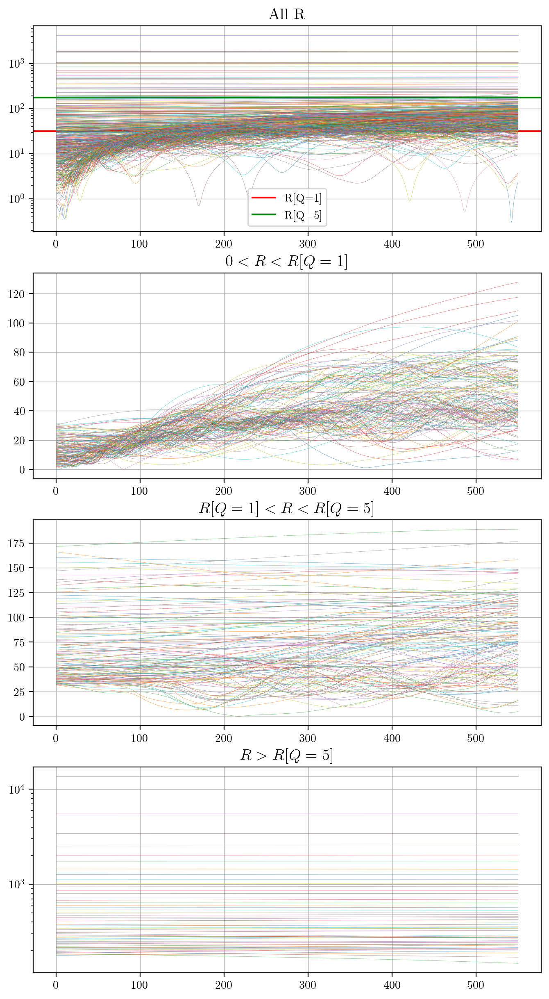

In [21]:
fig = plt.figure(figsize=(8,15))
idx_Q = find_nearest(Q,1)
idx_Q2 = find_nearest(Q,5)

ax = fig.add_subplot(411)
ax.set_title('All R')
ax.axhline(R[idx_Q], c='r', ls='-', label='R[Q=1]')
ax.axhline(R[idx_Q2], c='g', ls='-', label='R[Q=5]')
for i in np.random.randint(0,N,500):
    ax.plot(time, r[i], linewidth=0.3, alpha=0.6)
ax.set_yscale('log')
#ax.set_ylim(0,200)
ax.legend()

ax = fig.add_subplot(412)
ax.set_title('$0 < R < R[Q=1]$')
for i in range(0,idx_Q,500):
    ax.plot(time, r[i], linewidth=0.3, alpha=0.6)
#ax.set_yscale('log')

ax = fig.add_subplot(413)
ax.set_title('$R[Q=1] < R < R[Q=5]$')

for i in range(idx_Q, idx_Q2,200):
    ax.plot(time, r[i], linewidth=0.3, alpha=0.6)
    
ax = fig.add_subplot(414)
ax.set_title('$R > R[Q=5]$')

for i in range(idx_Q2,N, 100):
    ax.plot(time, r[i], linewidth=0.3, alpha=0.6)
ax.set_yscale('log')

plt.show()

## Animation

In [22]:
x_anim = np.array(x[::])
y_anim = np.array(y[::])
z_anim = np.array(z[::])

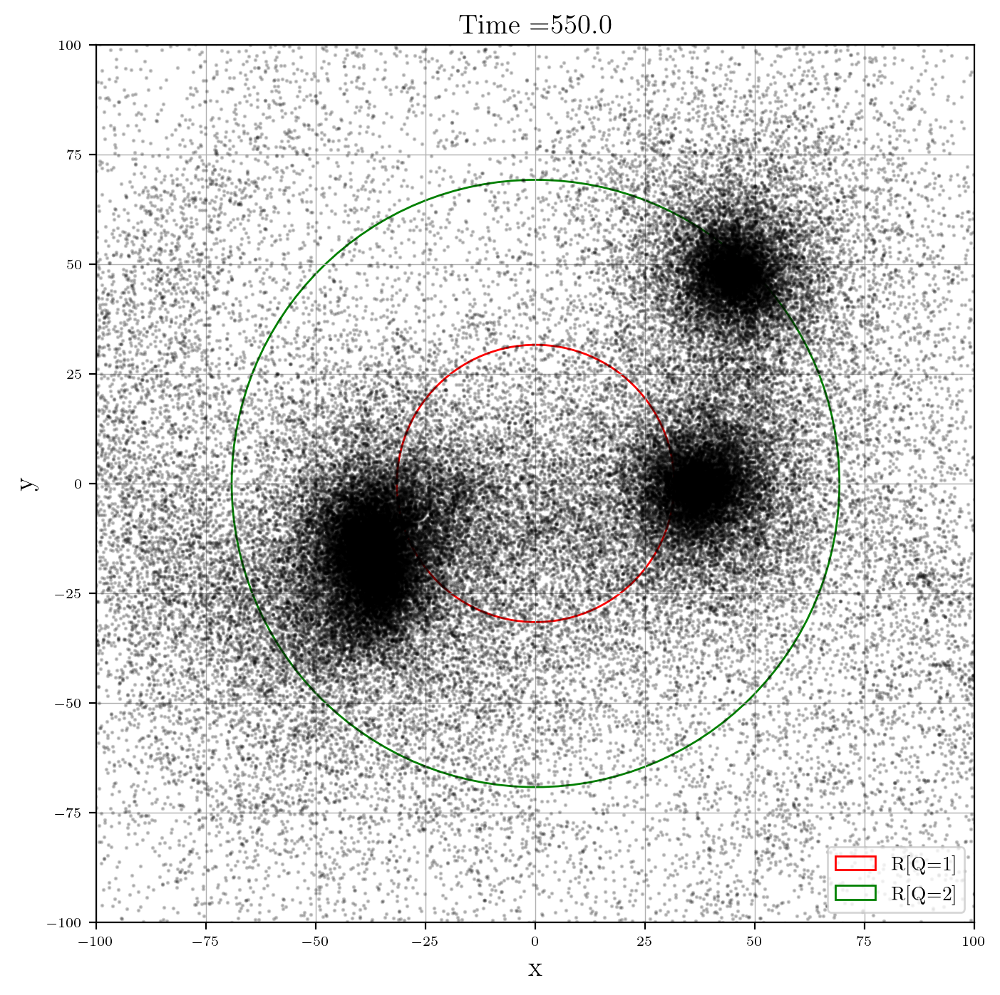

In [23]:
### plot------------------------------------------------------------------------------

fig = plt.figure(figsize = (8,8))
ax  = fig.add_subplot()
ax.set_aspect('equal')

ax.set_xlim(-100,100)
ax.set_ylim(-100,100)


ax.set_xlabel('x')
ax.set_ylabel('y')
ax.tick_params(axis='x', labelsize=7)
ax.tick_params(axis='y', labelsize=7)


#animation--------------------------------------------------------------------------------
scatters, = ax.plot([], [], 'o', alpha=0.2, c='k', markersize=1)

def init():
    scatters.set_data([], [])
    #scatters.set_3d_properties([])
    return scatters,

def animate_time(i): 
    scatters.set_data(x_anim[:,i], y_anim[:,i])
    #scatters.set_3d_properties(z_anim[:,i])
    ax.set_title('Time =' + str(np.round((np.array(time))[i])))
        
    return scatters,


num_frames = len(time)
animazione = FuncAnimation(fig, animate_time, frames=num_frames, interval=100, init_func=init)

circle_Q = plt.Circle((0, 0, 0), R[idx_Q], color='r', fill=False, label='R[Q=1]')
circle_Q2 = plt.Circle((0, 0, 0), R[find_nearest(Q,2)], color='g', fill=False, label='R[Q=2]')

ax.add_patch(circle_Q)
ax.add_patch(circle_Q2)

animazione.save('disk1.gif', writer = 'ffmpeg')
plt.legend(loc = 'lower right')
plt.show()

plt.rcParams['animation.html'] = 'html5'
#animazione

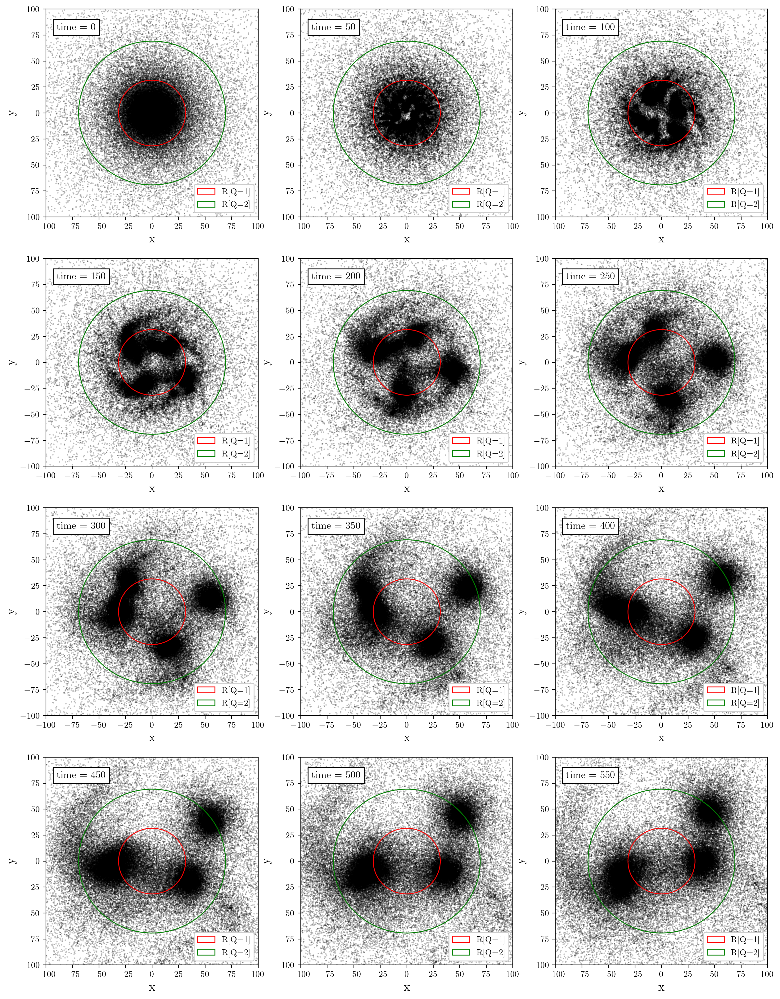

In [29]:
fig = plt.figure(figsize = (15,20))
snaps=12
idx_t = np.arange(0,len(time),int(len(time)/(snaps-1)))
for i in range(snaps):
    
    ax = fig.add_subplot(4,3,i+1)
    ax.scatter(x[:,idx_t[i]], y[:,idx_t[i]], color='k', s=0.5, alpha=0.2)
    circle_Q = plt.Circle((0, 0, 0), R[idx_Q], color='r', fill=False, label='R[Q=1]')
    circle_Q2 = plt.Circle((0, 0, 0), R[find_nearest(Q,2)], color='g', fill=False, label='R[Q=2]')

    ax.add_patch(circle_Q)
    ax.add_patch(circle_Q2)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_xlim(-100,100)
    ax.set_ylim(-100,100)
    ax.text(0.05, 0.9, 'time = %i'%idx_t[i], transform=ax.transAxes, fontsize=12, bbox=dict(facecolor='white'))
    ax.grid()
    ax.legend(framealpha=1, loc='lower right')
plt.show()

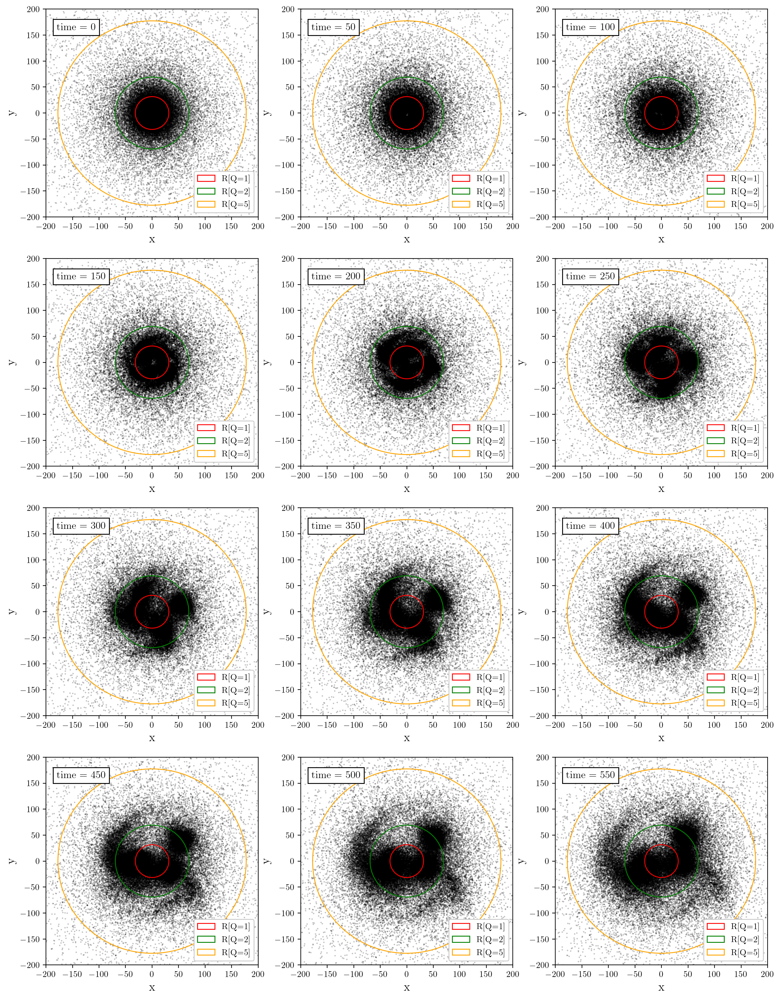

In [28]:
fig = plt.figure(figsize = (15,20))
snaps=12
idx_t = np.arange(0,len(time),int(len(time)/(snaps-1)))
for i in range(snaps):
    
    ax = fig.add_subplot(4,3,i+1)
    ax.scatter(x[:,idx_t[i]], y[:,idx_t[i]], color='k', s=0.5, alpha=0.2)
    circle_Q = plt.Circle((0, 0, 0), R[idx_Q], color='r', fill=False, label='R[Q=1]')
    circle_Q2 = plt.Circle((0, 0, 0), R[find_nearest(Q,2)], color='g', fill=False, label='R[Q=2]')
    circle_Q3 = plt.Circle((0, 0, 0), R[find_nearest(Q,5)], color='orange', fill=False, label='R[Q=5]')

    ax.add_patch(circle_Q)
    ax.add_patch(circle_Q2)
    ax.add_patch(circle_Q3)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_xlim(-200,200)
    ax.set_ylim(-200,200)
    ax.text(0.05, 0.9, 'time = %i'%idx_t[i], transform=ax.transAxes, fontsize=12, bbox=dict(facecolor='white'))
    ax.grid()
    ax.legend(framealpha=1, loc='lower right')
plt.show()